In [1]:
from collections import defaultdict, Counter 
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.spatial import distance, ConvexHull
from sklearn.neighbors import NearestNeighbors
from sklearn.cluster import KMeans
from sklearn.metrics import mutual_info_score
from sklearn.manifold import TSNE
import fcsparser 
from ete3 import Tree, TreeNode

In [2]:
%load_ext rmagic

/n/home05/aewhatley/anaconda3/lib/python3.6/site-packages/IPython/extensions/rmagic.py:11: UserWarning: The rmagic extension in IPython has moved to `rpy2.ipython`, please see `rpy2` documentation.
  warnings.warn("The rmagic extension in IPython has moved to "


In [3]:
supplementary_data = pd.read_csv('../Suppl.Table2.CODEX_paper_MRLdatasetexpression.csv')
supplementary_data = supplementary_data[['X.X', 'Y.Y', 'Z.Z', 'sample_Xtile_Ytile', 'CD45']]
supplementary_data.rename(columns={'X.X': 'X', 'Y.Y': 'Y', 'Z.Z': 'Z'}, inplace=True)
supplementary_data['CD45_int'] = supplementary_data['CD45'].astype(int)

def read_fcs(path):
    # read FCS using R library 
    %Rpush path 
    %R library(flowCore)
    %R df = read.FCS(path, transformation=FALSE)
    %Rpull df
    
    return df

def convert_coordinates(df, tile_length=1342, tile_width=1006):
    df['tile_x'] = df['sample_Xtile_Ytile'].apply(lambda x: int(x.split('_')[1][2])) - 1
    df['tile_y'] = df['sample_Xtile_Ytile'].apply(lambda x: int(x.split('_')[2][2])) - 1
    df['X'] = tile_length * df['tile_x'] + df['X']
    df['Y'] = tile_width * df['tile_y'] + df['Y']
    df.drop(['tile_x', 'tile_y', 'sample_Xtile_Ytile'], axis=1, inplace=True)
    
    return df

def process_fcs(df):
    df.rename(columns={'F4': 'F480', 'CD16': 'CD1632', 'CD21': 'CD2135', 
                       'X.X': 'X', 'Y.Y': 'Y', 'Z.Z': 'Z'}, inplace=True)
    df['CD45_int'] = df['CD45'].astype(int)
    df = pd.merge(df, supplementary_data, on=['X', 'Y', 'Z', 'CD45_int'])
    df = convert_coordinates(df)
    df.drop('CD45_int', axis=1, inplace=True)
    
    return df

def get_clusters(sample_name):
    all_neighbors = list(reversed(range(5, 100+1)))
    nn_nums = []
    num_clusters = []
    for nn in all_neighbors:
        try:
            _, data = fcsparser.parse('/n/regal/nowak_lab/aewhatley/X-Shift_Analysis/' + sample_name + '/' + 
                                                     str(nn) + '/out/' + sample_name + '.fcs') 
            clusters = len(np.unique(data['cluster_id']))
            num_clusters.append(clusters)
            nn_nums.append(nn)
        except:
            continue
    
    return num_clusters, nn_nums

def get_unique_clusters(sample_name):
    num_clusters, nn_nums = get_clusters(sample_name)
    dist_neighbors, dist_clusters = [], []
    for i in range(len(num_clusters)):
        if i > 0 and num_clusters[i] != num_clusters[i-1]:
            dist_neighbors.append(nn_nums[i])
            dist_clusters.append(num_clusters[i])
    
    return dist_clusters, dist_neighbors

## Probability Metric

In [4]:
def probability_neighbor_same(data):
    coords = data[['X', 'Y']].values
    clusters = data['cluster_id'].values
    nbrs_model = NearestNeighbors(n_neighbors = 1).fit(coords)
    _, indices = nbrs_model.kneighbors(coords)
    prob = np.mean(clusters == clusters[indices])
    return prob

In [9]:
def make_probability_metric_graph(sample_name):
    num_clusters, nn_nums = get_unique_clusters(sample_name)
    probs = []
    for ind, nn in enumerate(nn_nums):
        print(nn)
        path = '/n/regal/nowak_lab/aewhatley/X-Shift_Analysis/' + sample_name + '/' + \
               str(nn) + '/out/' + sample_name + '.fcs' 
        _, data = fcsparser.parse(path)
        data = process_fcs(data)
        probs.append(probability_neighbor_same(data))
    plt.plot(num_clusters, probs)
    plt.title(sample_name)
    plt.xlabel('Clusters')
    plt.ylabel('Probability')
    plt.show()

On 100
On 99


/n/home05/aewhatley/anaconda3/lib/python3.6/site-packages/fcsparser/api.py:332: UserWarning: The default channel names (defined by the $PnS parameter in the FCS file) were not unique. To avoid problems in downstream analysis, the channel names have been switched to the alternate channel names defined in the FCS file. To avoid seeing this warning message, explicitly instruct the FCS parser to use the alternate channel names by specifying the channel_naming parameter.
  warnings.warn(msg)


On 98
On 97
On 96
On 95
On 94
On 93
On 92
On 91
On 90
On 89
On 88
On 87
On 86
On 85
On 84
On 83
On 82
On 81
On 80
On 79
On 78
On 77
On 76
On 75
On 74
On 73
On 72
On 71
On 70
On 69
On 68
On 67
On 66
On 65
On 64
On 63
On 62
On 61
On 60
On 59
On 58
On 57
On 56
On 55
On 54
On 53
On 52
On 51
On 50
On 49
On 48
On 47
On 46
On 45
On 44
On 43
On 42
On 41
On 40
On 39
On 38
On 37
On 36
On 35
On 34
On 33
On 32
On 31
On 30
On 29
On 28
On 27
On 26
On 25
On 24
On 23
On 22
On 21
On 20
On 19
On 18
On 17
On 16
On 15
On 14
On 13
On 12
On 11
On 10
On 9
On 8
On 7
On 6
On 5
98
90
88
72
68
64
61
59
55
54
51
49
47
44
41
39
38
36
35
34
30
29
28
27
26
25
24
23
20
19
17
15
14
13
12
11
10
9
8
7
6
5


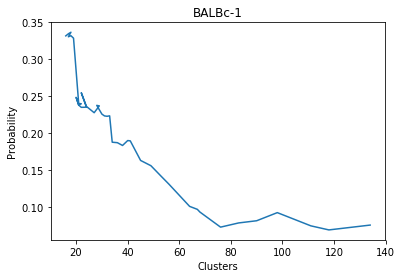

In [17]:
make_probability_metric_graph('BALBc-1')

On 100
On 99
On 98


/n/home05/aewhatley/anaconda3/lib/python3.6/site-packages/fcsparser/api.py:332: UserWarning: The default channel names (defined by the $PnS parameter in the FCS file) were not unique. To avoid problems in downstream analysis, the channel names have been switched to the alternate channel names defined in the FCS file. To avoid seeing this warning message, explicitly instruct the FCS parser to use the alternate channel names by specifying the channel_naming parameter.
  warnings.warn(msg)


On 97
On 96
On 95
On 94
On 93
On 92
On 91
On 90
On 89
On 88
On 87
On 86
On 85
On 84
On 83
On 82
On 81
On 80
On 79
On 78
On 77
On 76
On 75
On 74
On 73
On 72
On 71
On 70
On 69
On 68
On 67
On 66
On 65
On 64
On 63
On 62
On 61
On 60
On 59
On 58
On 57
On 56
On 55
On 54
On 53
On 52
On 51
On 50
On 49
On 48
On 47
On 46
On 45
On 44
On 43
On 42
On 41
On 40
On 39
On 38
On 37
On 36
On 35
On 34
On 33
On 32
On 31
On 30
On 29
On 28
On 27
On 26
On 25
On 24
On 23
On 22
On 21
On 20
On 19
On 18
On 17
On 16
On 15
On 14
On 13
On 12
On 11
On 10
On 9
On 8
On 7
On 6
On 5
90
85
82
80
75
73
60
55
53
51
49
48
35
34
30
27
26
25
23
22
20
18
17
16
15
14
13
12
11
10
8
7


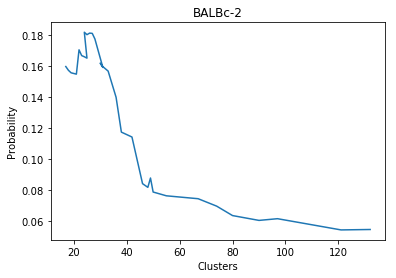

In [21]:
make_probability_metric_graph('BALBc-2')

On 100
On 99
On 98
On 97
On 96
On 95
On 94
On 93
On 92
On 91


/n/home05/aewhatley/anaconda3/lib/python3.6/site-packages/fcsparser/api.py:332: UserWarning: The default channel names (defined by the $PnS parameter in the FCS file) were not unique. To avoid problems in downstream analysis, the channel names have been switched to the alternate channel names defined in the FCS file. To avoid seeing this warning message, explicitly instruct the FCS parser to use the alternate channel names by specifying the channel_naming parameter.
  warnings.warn(msg)


On 90
On 89
On 88
On 87
On 86
On 85
On 84
On 83
On 82
On 81
On 80
On 79
On 78
On 77
On 76
On 75
On 74
On 73
On 72
On 71
On 70
On 69
On 68
On 67
On 66
On 65
On 64
On 63
On 62
On 61
On 60
On 59
On 58
On 57
On 56
On 55
On 54
On 53
On 52
On 51
On 50
On 49
On 48
On 47
On 46
On 45
On 44
On 43
On 42
On 41
On 40
On 39
On 38
On 37
On 36
On 35
On 34
On 33
On 32
On 31
On 30
On 29
On 28
On 27
On 26
On 25
On 24
On 23
On 22
On 21
On 20
On 19
On 18
On 17
On 16
On 15
On 14
On 13
On 12
On 11
On 10
On 9
On 8
On 7
On 6
On 5
90
81
79
73
67
57
52
50
44
42
41
40
38
37
34
31
30
29
26
25
24
23
21
20
19
18
17
16
14
13
12
11
10
9
7
6
5


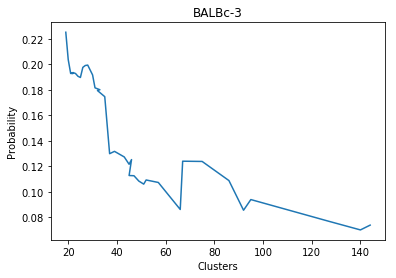

In [20]:
make_probability_metric_graph('BALBc-3')

On 100


/n/home05/aewhatley/anaconda3/lib/python3.6/site-packages/fcsparser/api.py:332: UserWarning: The default channel names (defined by the $PnS parameter in the FCS file) were not unique. To avoid problems in downstream analysis, the channel names have been switched to the alternate channel names defined in the FCS file. To avoid seeing this warning message, explicitly instruct the FCS parser to use the alternate channel names by specifying the channel_naming parameter.
  warnings.warn(msg)


On 99
On 98
On 97
On 96
On 95
On 94
On 93
On 92
On 91
On 90
On 89
On 88
On 87
On 86
On 85
On 84
On 83
On 82
On 81
On 80
On 79
On 78
On 77
On 76
On 75
On 74
On 73
On 72
On 71
On 70
On 69
On 68
On 67
On 66
On 65
On 64
On 63
On 62
On 61
On 60
On 59
On 58
On 57
On 56
On 55
On 54
On 53
On 52
On 51
On 50
On 49
On 48
On 47
On 46
On 45
On 44
On 43
On 42
On 41
On 40
On 39
On 38
On 37
On 36
On 35
On 34
On 33
On 32
On 31
On 30
On 29
On 28
On 27
On 26
On 25
On 24
On 23
On 22
On 21
On 20
On 19
On 18
On 17
On 16
On 15
On 14
On 13
On 12
On 11
On 10
On 9
On 8
On 7
On 6
On 5
84
82
77
72
70
62
55
53
52
45
43
41
36
33
29
27
25
24
23
22
21
20
19
17
16
15
14
13
12
11
10
9
8
7
6
5


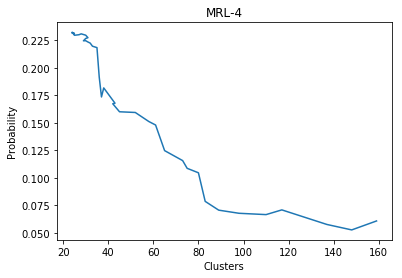

In [10]:
make_probability_metric_graph('MRL-4')

On 100
On 99
On 98
On 97
On 96
On 95
On 94
On 93
On 92
On 91


/n/home05/aewhatley/anaconda3/lib/python3.6/site-packages/fcsparser/api.py:332: UserWarning: The default channel names (defined by the $PnS parameter in the FCS file) were not unique. To avoid problems in downstream analysis, the channel names have been switched to the alternate channel names defined in the FCS file. To avoid seeing this warning message, explicitly instruct the FCS parser to use the alternate channel names by specifying the channel_naming parameter.
  warnings.warn(msg)


On 90
On 89
On 88
On 87
On 86
On 85
On 84
On 83
On 82
On 81
On 80
On 79
On 78
On 77
On 76
On 75
On 74
On 73
On 72
On 71
On 70
On 69
On 68
On 67
On 66
On 65
On 64
On 63
On 62
On 61
On 60
On 59
On 58
On 57
On 56
On 55
On 54
On 53
On 52
On 51
On 50
On 49
On 48
On 47
On 46
On 45
On 44
On 43
On 42
On 41
On 40
On 39
On 38
On 37
On 36
On 35
On 34
On 33
On 32
On 31
On 30
On 29
On 28
On 27
On 26
On 25
On 24
On 23
On 22
On 21
On 20
On 19
On 18
On 17
On 16
On 15
On 14
On 13
On 12
On 11
On 10
On 9
On 8
On 7
On 6
On 5
98
96
95
94
78
76
65
64
60
55
52
51
49
47
45
44
42
41
40
39
38
37
36
35
34
31
30
29
28
27
26
25
24
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5


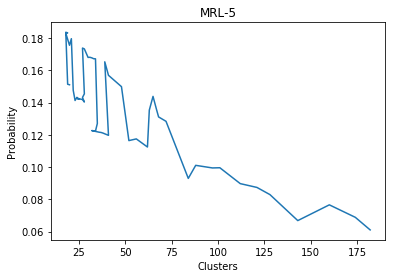

In [12]:
make_probability_metric_graph('MRL-5')

On 100


/n/home05/aewhatley/anaconda3/lib/python3.6/site-packages/fcsparser/api.py:332: UserWarning: The default channel names (defined by the $PnS parameter in the FCS file) were not unique. To avoid problems in downstream analysis, the channel names have been switched to the alternate channel names defined in the FCS file. To avoid seeing this warning message, explicitly instruct the FCS parser to use the alternate channel names by specifying the channel_naming parameter.
  warnings.warn(msg)


On 99
On 98
On 97
On 96
On 95
On 94
On 93
On 92
On 91
On 90
On 89
On 88
On 87
On 86
On 85
On 84
On 83
On 82
On 81
On 80
On 79
On 78
On 77
On 76
On 75
On 74
On 73
On 72
On 71
On 70
On 69
On 68
On 67
On 66
On 65
On 64
On 63
On 62
On 61
On 60
On 59
On 58
On 57
On 56
On 55
On 54
On 53
On 52
On 51
On 50
On 49
On 48
On 47
On 46
On 45
On 44
On 43
On 42
On 41
On 40
On 39
On 38
On 37
On 36
On 35
On 34
On 33
On 32
On 31
On 30
On 29
On 28
On 27
On 26
On 25
On 24
On 23
On 22
On 21
On 20
On 19
On 18
On 17
On 16
On 15
On 14
On 13
On 12
On 11
On 10
On 9
On 8
On 7
On 6
On 5
98
95
71
64
61
46
45
44
39
38
36
35
34
32
31
29
28
26
25
24
23
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5


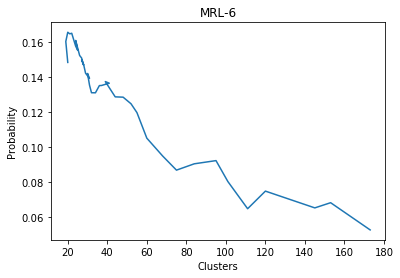

In [13]:
make_probability_metric_graph('MRL-6')

On 100
On 99


/n/home05/aewhatley/anaconda3/lib/python3.6/site-packages/fcsparser/api.py:332: UserWarning: The default channel names (defined by the $PnS parameter in the FCS file) were not unique. To avoid problems in downstream analysis, the channel names have been switched to the alternate channel names defined in the FCS file. To avoid seeing this warning message, explicitly instruct the FCS parser to use the alternate channel names by specifying the channel_naming parameter.
  warnings.warn(msg)


On 98
On 97
On 96
On 95
On 94
On 93
On 92
On 91
On 90
On 89
On 88
On 87
On 86
On 85
On 84
On 83
On 82
On 81
On 80
On 79
On 78
On 77
On 76
On 75
On 74
On 73
On 72
On 71
On 70
On 69
On 68
On 67
On 66
On 65
On 64
On 63
On 62
On 61
On 60
On 59
On 58
On 57
On 56
On 55
On 54
On 53
On 52
On 51
On 50
On 49
On 48
On 47
On 46
On 45
On 44
On 43
On 42
On 41
On 40
On 39
On 38
On 37
On 36
On 35
On 34
On 33
On 32
On 31
On 30
On 29
On 28
On 27
On 26
On 25
On 24
On 23
On 22
On 21
On 20
On 19
On 18
On 17
On 16
On 15
On 14
On 13
On 12
On 11
On 10
On 9
On 8
On 7
On 6
On 5
95
88
74
66
65
64
61
58
57
52
49
46
43
40
37
32
30
29
28
26
24
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5


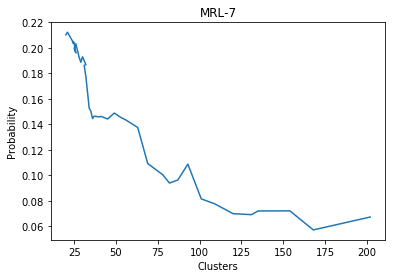

In [14]:
make_probability_metric_graph('MRL-7')

On 100


/n/home05/aewhatley/anaconda3/lib/python3.6/site-packages/fcsparser/api.py:332: UserWarning: The default channel names (defined by the $PnS parameter in the FCS file) were not unique. To avoid problems in downstream analysis, the channel names have been switched to the alternate channel names defined in the FCS file. To avoid seeing this warning message, explicitly instruct the FCS parser to use the alternate channel names by specifying the channel_naming parameter.
  warnings.warn(msg)


On 99
On 98
On 97
On 96
On 95
On 94
On 93
On 92
On 91
On 90
On 89
On 88
On 87
On 86
On 85
On 84
On 83
On 82
On 81
On 80
On 79
On 78
On 77
On 76
On 75
On 74
On 73
On 72
On 71
On 70
On 69
On 68
On 67
On 66
On 65
On 64
On 63
On 62
On 61
On 60
On 59
On 58
On 57
On 56
On 55
On 54
On 53
On 52
On 51
On 50
On 49
On 48
On 47
On 46
On 45
On 44
On 43
On 42
On 41
On 40
On 39
On 38
On 37
On 36
On 35
On 34
On 33
On 32
On 31
On 30
On 29
On 28
On 27
On 26
On 25
On 24
On 23
On 22
On 21
On 20
On 19
On 18
On 17
On 16
On 15
On 14
On 13
On 12
On 11
On 10
On 9
On 8
On 7
On 6
On 5
91
79
53
42
37
33
32
30
29
28
27
26
25
24
23
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5


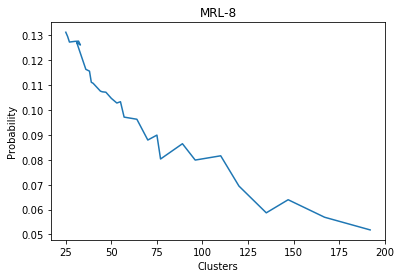

In [15]:
make_probability_metric_graph('MRL-8')

On 100
On 99


/n/home05/aewhatley/anaconda3/lib/python3.6/site-packages/fcsparser/api.py:332: UserWarning: The default channel names (defined by the $PnS parameter in the FCS file) were not unique. To avoid problems in downstream analysis, the channel names have been switched to the alternate channel names defined in the FCS file. To avoid seeing this warning message, explicitly instruct the FCS parser to use the alternate channel names by specifying the channel_naming parameter.
  warnings.warn(msg)


On 98
On 97
On 96
On 95
On 94
On 93
On 92
On 91
On 90
On 89
On 88
On 87
On 86
On 85
On 84
On 83
On 82
On 81
On 80
On 79
On 78
On 77
On 76
On 75
On 74
On 73
On 72
On 71
On 70
On 69
On 68
On 67
On 66
On 65
On 64
On 63
On 62
On 61
On 60
On 59
On 58
On 57
On 56
On 55
On 54
On 53
On 52
On 51
On 50
On 49
On 48
On 47
On 46
On 45
On 44
On 43
On 42
On 41
On 40
On 39
On 38
On 37
On 36
On 35
On 34
On 33
On 32
On 31
On 30
On 29
On 28
On 27
On 26
On 25
On 24
On 23
On 22
On 21
On 20
On 19
On 18
On 17
On 16
On 15
On 14
On 13
On 12
On 11
On 10
On 9
On 8
On 7
On 6
On 5
99
82
75
68
65
62
57
55
48
47
45
40
39
34
33
31
30
28
27
26
23
22
21
20
19
18
17
16
15
14
13
12
11
10
9
8
7
6
5


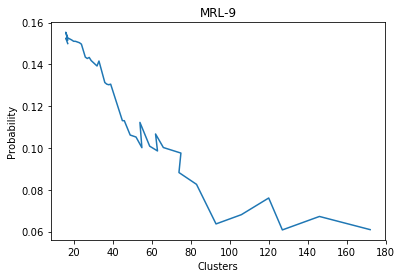

In [16]:
make_probability_metric_graph('MRL-9')

## Mutual Information Based Metric 

In [4]:
def interaction_mutual_info (concat, celltypeA,celltypeB,num_clusters = 2,
                             col_name = 'unique_paths',subset_col_name = 'subset',return_subsets = True):
    '''
    concat: included marker expressions
    cellA:  clusterid of first cell of interest
    cellB:  clusterid of second cell of interest
    num_clusters:  number of clusters in which to subset data by marker expression
    '''
    a, b, cellA, cellB = get_neighbor_subset_list(concat, celltypeA, celltypeB, num_clusters,
                                                  col_name = col_name, subset_col_name = subset_col_name)
    
    if return_subsets:
        return mutual_info_score(a,b), a,b, cellA,cellB
    
    return mutual_info_score(a,b)

  
def get_subset_list(concat, celltype, num_clusters, col_name, subset_col_name):
    
    cell_bulk = paths[paths["cluster_id"]==celltype] #datset to calculate KMeans subclusters over
    cell_subset = marker_subsets(concat,cell_bulk['index'],num_clusters) #calculate subclusters
    cell_bulk[subset_col_name] = cell_subset
    
    return cell_bulk

  
def get_neighbor_subset_list(concat, celltypeA, celltypeB,num_clusters, col_name, subset_col_name):
    cellA_bulk = get_subset_list(concat, celltypeA, num_clusters, col_name, subset_col_name)
    cellB_bulk = get_subset_list(concat, celltypeB, num_clusters, col_name, subset_col_name)
    neighs = knn_list(cellA_bulk, cellB_bulk) # nearest cell B

    return cellA_bulk[subset_col_name], cellB_bulk[subset_col_name][neighs], cellA_bulk, cellB_bulk
    

def knn_list(cellA, cellB):
    
    '''
    cellA:  dataframe of cellAs of interest
    cellB: dataframe of cellBs of interest
    returns" array of indices of nearest cellB to each cell A
    '''
    nbrs_model = NearestNeighbors(n_neighbors = 1).fit(cellB[["X","Y"]])
    _, indices = nbrs_model.kneighbors(cellA[["X","Y"]])
    return indices[:,0]
    
    
def marker_subsets(concat, cellA_index, num_clusters):
    
    '''
    concat: concatenated df of cell marker expressions (pruned to only include desired features)
    '''
    
    a_markers = concat.iloc[cellA_index] 
    a_subset = KMeans(n_clusters=num_clusters).fit_predict(a_markers)
   
    return a_subset


In [ ]:
sample_name = 'BALBc-1'
num_clusters, nn_nums = get_unique_clusters('BALBc-1')
all_mutual_info = []
for ind, nn in enumerate(nn_nums):
    path = '/n/regal/nowak_lab/aewhatley/X-Shift_Analysis/' + sample_name + '/' + \
           str(nn) + '/out/' + sample_name + '.fcs' 
    _, data = fcsparser.parse(path)
    data = process_fcs(data)
    num_clusters = len(np.unique(data['cluster_id']))
    mutual_info = 0
    for i in range(num_clusters):
        for j in range(i):
            mutual_info += interaction_mutual_info (data[['X','Y','cluster_id']], 
                                                   i, j, return_subsets = False)
    all_mutual_info.append(mutual_info)
plt.plot(nn_nums, all_mutual_info)

## Tree Clustering/Density-Based Metric

In [4]:
def add_tree_layer(tree, leaves, clusters, proportions, child_coords, prop_filter):
    '''
    tree: tree that we want to add an additional layer to
    leaves: leaves of tree 
    clusters: number of clusters in the child layer
    proportions: nested dictionary containing id of parent and id of child and the proportion of cells 
                 contained in the parent that are also contained in the child 
    prop_filter: proportion of cells for edge between clusters to be created 
    '''
    child_nodes = {}
    for ind in range(len(clusters)):
        child_node_id = clusters[ind]
        child_nodes[child_node_id] = TreeNode(name=child_node_id)
        # add coordinate data to node 
        child_nodes[child_node_id].add_features(coords=child_coords[child_node_id]) 
        child_nodes[child_node_id].add_features(cluster_id=child_node_id)
    for parent_node_id, parent_node in leaves.items():
        for child_node_id, child_node in child_nodes.items():
            if proportions[parent_node_id][child_node_id] > prop_filter:
                parent_node.add_child(child_node)
                
    return tree, child_nodes
    
def build_tree(fcs_paths, num_neighbors, prop_filter=0.1):
    '''
    fcs_paths: dictionary of (cluster numbers, path)
    num_neighbors: number of neighbors used in X-shift 
    prop_filter: proportion of cells for edge between clusters to be created 
    '''
    # first initialize tree with 1 node at top and its children 
    tree = TreeNode(name=0)
    leaves = {0: tree}
    _, cluster_data_child = fcsparser.parse(fcs_paths[0])
    cluster_data_child = process_fcs(cluster_data_child)
    tree.add_features(coords=cluster_data_child[['X', 'Y']].values)
    tree.add_features(cluster_id=0)
    child_cluster_counts = cluster_data_child['cluster_id'].value_counts()
    child_coords = cluster_data_child[['cluster_id', 'X', 'Y']]
    child_coords_groupby = child_coords.groupby('cluster_id')
    child_coords = {group: child_coords.loc[inds, ['X', 'Y']].values
                    for group, inds in child_coords_groupby.groups.items()}
    clusters = list(child_cluster_counts.keys())
    child_cluster_counts /= child_cluster_counts.sum()
    proportions = {0 : child_cluster_counts.to_dict()}
    tree, leaves = add_tree_layer(tree, leaves, clusters, proportions, child_coords, prop_filter)
    
    # build the rest of the tree 
    for ind, nn in enumerate(num_neighbors[:-1]):
        #print('Processing layer', nn)
        _, cluster_data_parent = fcsparser.parse(fcs_paths[ind])
        _, cluster_data_child = fcsparser.parse(fcs_paths[ind+1])
        cluster_data_parent = process_fcs(cluster_data_parent)
        cluster_data_child = process_fcs(cluster_data_child)
        
        child_cluster_counts = cluster_data_child['cluster_id'].value_counts()
        clusters = list(child_cluster_counts.keys())
        match_data_parent = cluster_data_parent[['X', 'Y', 'Z', 'cluster_id']].astype(int)
        match_data_child = cluster_data_child[['X', 'Y', 'Z', 'cluster_id']].astype(int)
        merged = pd.merge(match_data_parent, match_data_child, on=['X', 'Y', 'Z'])
        parent_clusters = merged['cluster_id_x'].tolist()
        child_clusters = merged['cluster_id_y'].tolist()
        child_coords = cluster_data_child[['cluster_id', 'X', 'Y']]
        child_coords_groupby = child_coords.groupby('cluster_id')
        child_coords = {group: child_coords.loc[inds, ['X', 'Y']].values
                        for group, inds in child_coords_groupby.groups.items()}
        proportions = defaultdict(Counter)
        for parent_cluster, child_cluster in zip(parent_clusters, child_clusters):
            proportions[parent_cluster][child_cluster] += 1/child_cluster_counts[child_cluster]
        tree, leaves = add_tree_layer(tree, leaves, clusters, proportions, child_coords, prop_filter)
        
    return tree 

def layer_compactness(layer):
    '''
    Using the hierarchical tree of clusters we create above, we compute the 
    difference of the intra-cluster distances in the parent cluster layer and the 
    child cluster layer, and report how many clusters become better separated in the 
    children and worse separated in the children. 
    '''
    def get_intracluster_dist(coords, limit=20000):
        '''
        Average intracluster distance. 
        '''
        if len(coords) > limit:
            ind = np.random.choice(len(coords), size=limit, replace=False)
            coords = coords[ind]
        intracluster_dist = (1/len(coords))*np.sum(distance.cdist(coords, coords))
        return intracluster_dist
    
    def get_density(coords):
        '''
        Number of points divided by area of convex hull.
        '''
        hull = ConvexHull(coords)
        return len(coords)/hull.area
        
    density_cost = 0
    for node in layer:
        if len(node.children) < 2:
            continue
        else:
            parent_dist = get_density(np.array(node.coords))
            child_dist = np.sum([get_density(np.array(child.coords)) 
                                           for child in node.children if len(child.coords) > 2])
            density_cost += (child_dist - parent_dist)
    
    return density_cost

def probability_neighbor_same(data, cluster_num):
    '''
    Compute the probability that the nearest neighbors of 
    each cluster point are also the same cluster. 
    '''
    coords = data[['X', 'Y']].values
    clusters = data['cluster_id'].values
    cluster_ind = np.where(clusters == cluster_num)[0]
    nbrs_model = NearestNeighbors(n_neighbors = 1).fit(coords)
    _, indices = nbrs_model.kneighbors()
    prob = np.mean(clusters[indices[cluster_ind]] == cluster_num)
    return prob

def nearest_neighbor_prob_change(parent_data, child_data, layer):
    '''
    Using the hierarchical tree of clusters we create above, we compute the 
    difference of the average probability that the child cluster's closest neighbor 
    is in the same cluster, and the probability that the parent cluster's closest 
    neighbor is in the same cluster. 
    ''' 
    prob_change = 0
    for node in layer:
        if len(node.children) < 2:
            continue
        else:
            parent_prob = probability_neighbor_same(parent_data, node.cluster_id)
            child_prob = np.mean([probability_neighbor_same(child_data, child.cluster_id)
                                           for child in node.children if len(child.coords) > 2])
            prob_change += (child_prob - parent_prob)
    
    return prob_change 
        
def tree_compactness(tree):
    '''
    Perform a BFS through the tree, and calculate the difference in cluster compactness
    between each layer and the one below it. 
    '''
    parent_layer = set([tree])
    child_layer = set(tree.children)
    num_clusters = []
    densities = []
    while child_layer:
        num_clusters.append(len(child_layer))
        density_cost = layer_compactness(parent_layer)
        densities.append(density_cost)
        new_layer = set()
        for node in child_layer:
            new_layer.update(node.children)
        parent_layer = child_layer
        child_layer = new_layer
    plt.plot(num_clusters, densities)
    plt.show()

def tree_probability_change(sample_name, fcs_paths, num_neighbors, num_clusters, tree):
    '''
    Perform a BFS through the tree, and calculate the difference in cluster probability 
    between each layer and the one below it. 
    '''
    layer = set(tree.children)
    prob_change = []
    for i in range(len(num_clusters) - 1):
        _, parent_data = fcsparser.parse(fcs_paths[i])
        _, child_data = fcsparser.parse(fcs_paths[i+1])
        parent_data, child_data = process_fcs(parent_data), process_fcs(child_data)
        prob_change.append(nearest_neighbor_prob_change(parent_data, child_data, layer))
        new_layer = set()
        for node in layer:
            new_layer.update(node.children)
        layer = new_layer
    plt.title(sample_name)
    plt.plot(num_clusters[:-1], prob_change)
    plt.show()
    
def tree_path_probabilities(sample_name, fcs_paths, num_neighbors, num_clusters, tree):
    '''
    Compute the probabilities of the leaves in the tree and all of their successors. 
    '''
    probs = {}
    probs[tree] = 1
    layer = set(tree.children)
    for path in fcs_paths:
        _, data = fcsparser.parse(path)
        data = process_fcs(data)
        new_layer = set()
        for node in layer:
            probs[node] = [len(layer), probability_neighbor_same(data, node.cluster_id)]
            new_layer.update(node.children)
        layer = new_layer
    # loop through all leaves and their ancestors
    path_probs = []
    for leaf in tree:
        path_probs.append([])
        while leaf.up and leaf in probs:
            path_probs[-1].append(probs[leaf])
            leaf = leaf.up
        
    return path_probs

In [5]:
def build_sample_tree(sample_name):
    num_clusters, num_neighbors = get_unique_clusters(sample_name)
    fcs_paths = ['/n/regal/nowak_lab/aewhatley/X-Shift_Analysis/' + sample_name + '/' + 
                 str(nn) + '/out/' + sample_name + '.fcs' for nn in num_neighbors]
    tree = build_tree(fcs_paths, num_neighbors)
    return tree

/n/home05/aewhatley/anaconda3/lib/python3.6/site-packages/fcsparser/api.py:332: UserWarning: The default channel names (defined by the $PnS parameter in the FCS file) were not unique. To avoid problems in downstream analysis, the channel names have been switched to the alternate channel names defined in the FCS file. To avoid seeing this warning message, explicitly instruct the FCS parser to use the alternate channel names by specifying the channel_naming parameter.
  warnings.warn(msg)


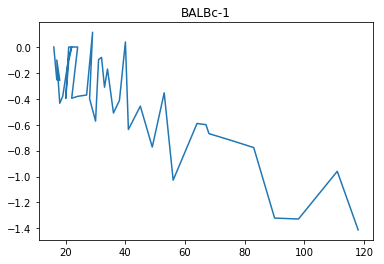

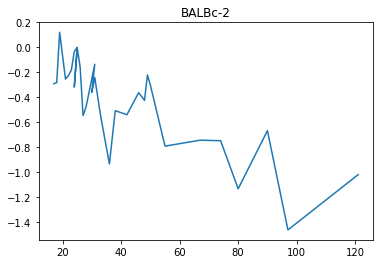

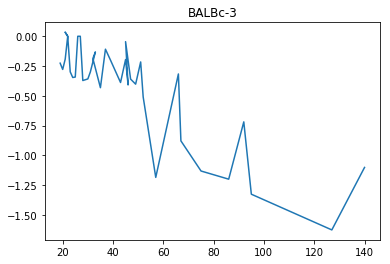

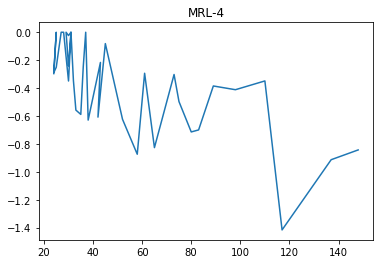

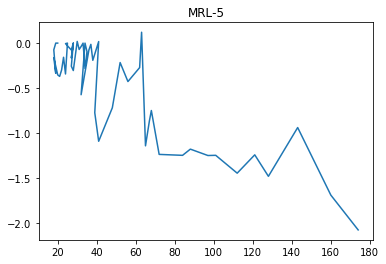

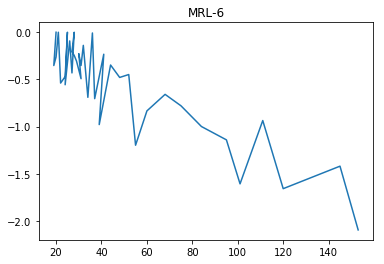

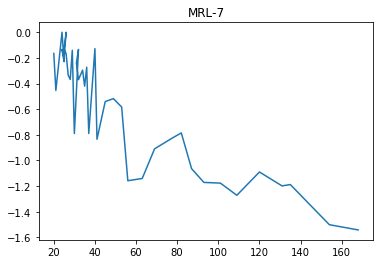

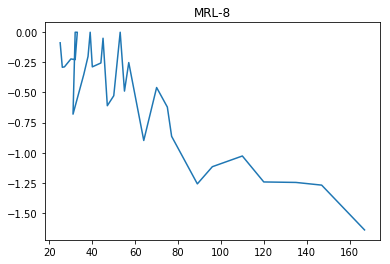

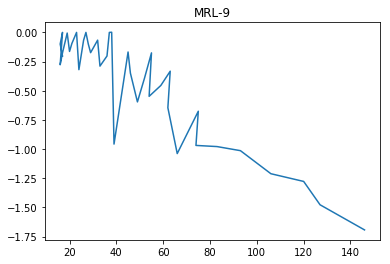

In [23]:
sample_names = ['BALBc-1', 'BALBc-2', 'BALBc-3', 'MRL-4', 'MRL-5', 'MRL-6', 'MRL-7', 'MRL-8', 'MRL-9']
for sample_name in sample_names:
    num_clusters, num_neighbors = get_unique_clusters(sample_name)
    fcs_paths = ['/n/regal/nowak_lab/aewhatley/X-Shift_Analysis/' + sample_name + '/' + 
                 str(nn) + '/out/' + sample_name + '.fcs' for nn in num_neighbors]
    tree = build_sample_tree(sample_name)
    tree_probability_change(sample_name, fcs_paths, num_neighbors, num_clusters, tree)

In [6]:
sample_name = 'BALBc-1'
num_clusters, num_neighbors = get_unique_clusters(sample_name)
fcs_paths = ['/n/regal/nowak_lab/aewhatley/X-Shift_Analysis/' + sample_name + '/' + 
             str(nn) + '/out/' + sample_name + '.fcs' for nn in num_neighbors]
tree = build_sample_tree(sample_name)
path_probs = tree_path_probabilities(sample_name, fcs_paths, num_neighbors, num_clusters, tree)

/n/home05/aewhatley/anaconda3/lib/python3.6/site-packages/fcsparser/api.py:332: UserWarning: The default channel names (defined by the $PnS parameter in the FCS file) were not unique. To avoid problems in downstream analysis, the channel names have been switched to the alternate channel names defined in the FCS file. To avoid seeing this warning message, explicitly instruct the FCS parser to use the alternate channel names by specifying the channel_naming parameter.
  warnings.warn(msg)
/n/home05/aewhatley/anaconda3/lib/python3.6/site-packages/fcsparser/api.py:332: UserWarning: The default channel names (defined by the $PnS parameter in the FCS file) were not unique. To avoid problems in downstream analysis, the channel names have been switched to the alternate channel names defined in the FCS file. To avoid seeing this warning message, explicitly instruct the FCS parser to use the alternate channel names by specifying the channel_naming parameter.
  warnings.warn(msg)


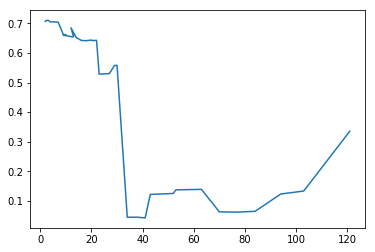

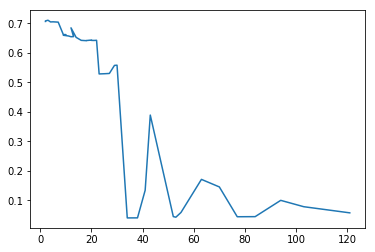

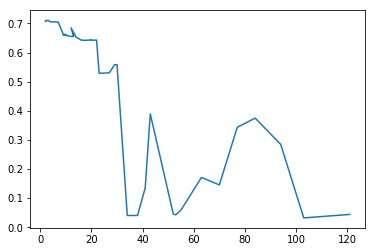

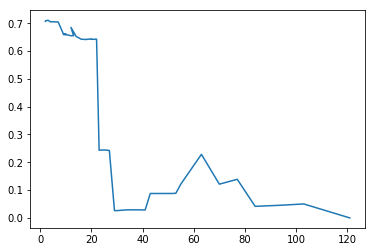

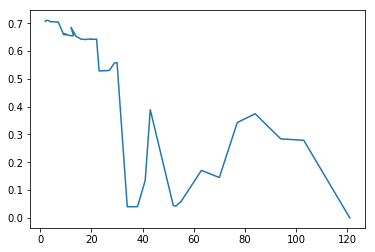

...

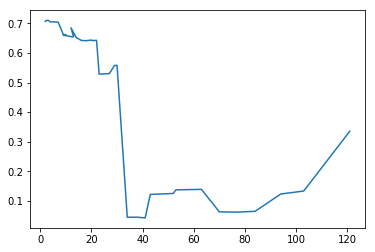

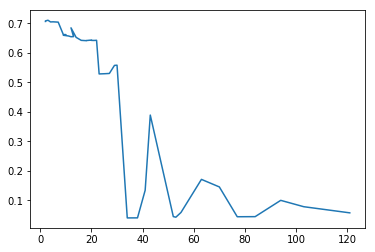

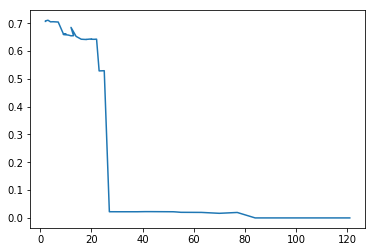

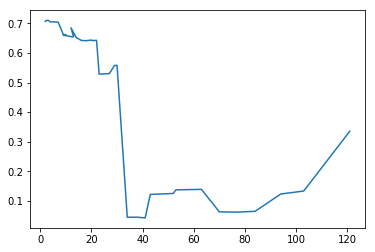

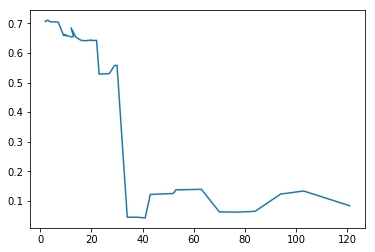

In [ ]:
for pp in path_probs:
    pp = np.array(pp)
    plt.plot(pp[:, 0].T, pp[:, 1].T)
    plt.show()

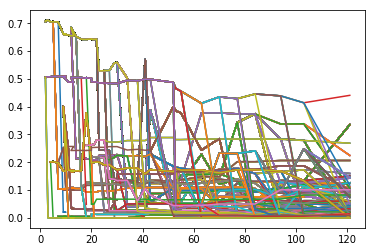

In [7]:
for pp in path_probs:
    pp = np.array(pp)
    plt.plot(pp[:, 0].T, pp[:, 1].T)
plt.show()

On 100


/n/home05/aewhatley/anaconda3/lib/python3.6/site-packages/fcsparser/api.py:332: UserWarning: The default channel names (defined by the $PnS parameter in the FCS file) were not unique. To avoid problems in downstream analysis, the channel names have been switched to the alternate channel names defined in the FCS file. To avoid seeing this warning message, explicitly instruct the FCS parser to use the alternate channel names by specifying the channel_naming parameter.
  warnings.warn(msg)


On 90
On 80
On 70
On 60
On 50
On 40
On 30
On 20
On 10
Processing layer 98
Processing layer 90
Processing layer 88
Processing layer 72
Processing layer 68
Processing layer 64
Processing layer 61
Processing layer 59
Processing layer 55
Processing layer 54
Processing layer 51
Processing layer 49
Processing layer 47
Processing layer 44
Processing layer 41
Processing layer 39
Processing layer 38
Processing layer 36
Processing layer 35
Processing layer 34
Processing layer 30
Processing layer 29
Processing layer 28
Processing layer 27
Processing layer 26
Processing layer 25
Processing layer 24
Processing layer 22
Processing layer 20
Processing layer 19
Processing layer 17
Processing layer 15
Processing layer 14
Processing layer 13
Processing layer 11
Processing layer 10
Processing layer 9
Processing layer 8
Processing layer 7
Processing layer 6


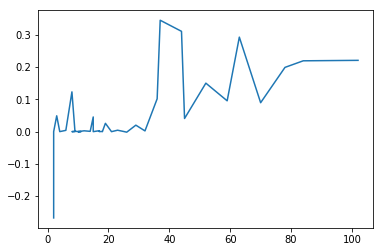

In [17]:
tree = build_sample_tree('BALBc-1')
tree_compactness(tree)

On 100


/n/home05/aewhatley/anaconda3/lib/python3.6/site-packages/fcsparser/api.py:332: UserWarning: The default channel names (defined by the $PnS parameter in the FCS file) were not unique. To avoid problems in downstream analysis, the channel names have been switched to the alternate channel names defined in the FCS file. To avoid seeing this warning message, explicitly instruct the FCS parser to use the alternate channel names by specifying the channel_naming parameter.
  warnings.warn(msg)


On 90
On 80
On 70
On 60
On 50
On 40
On 30
On 20
On 10
Processing layer 90
Processing layer 85
Processing layer 82
Processing layer 80
Processing layer 75
Processing layer 73
Processing layer 60
Processing layer 55
Processing layer 53
Processing layer 51
Processing layer 49
Processing layer 48
Processing layer 34
Processing layer 30
Processing layer 27
Processing layer 26
Processing layer 25
Processing layer 23
Processing layer 22
Processing layer 20
Processing layer 18
Processing layer 17
Processing layer 16
Processing layer 15
Processing layer 14
Processing layer 13
Processing layer 12
Processing layer 11


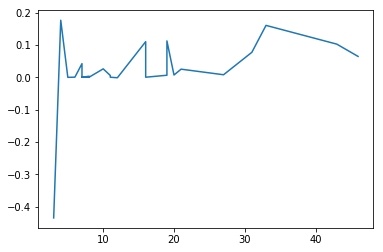

In [18]:
tree = build_sample_tree('BALBc-2')
tree_compactness(tree)

On 100


/n/home05/aewhatley/anaconda3/lib/python3.6/site-packages/fcsparser/api.py:332: UserWarning: The default channel names (defined by the $PnS parameter in the FCS file) were not unique. To avoid problems in downstream analysis, the channel names have been switched to the alternate channel names defined in the FCS file. To avoid seeing this warning message, explicitly instruct the FCS parser to use the alternate channel names by specifying the channel_naming parameter.
  warnings.warn(msg)


On 90
On 80
On 70
On 60
On 50
On 40
On 30
On 20
On 10
Processing layer 90
Processing layer 81
Processing layer 78
Processing layer 73
Processing layer 67
Processing layer 57
Processing layer 52
Processing layer 50
Processing layer 44
Processing layer 42
Processing layer 41
Processing layer 40
Processing layer 38
Processing layer 37
Processing layer 34
Processing layer 31
Processing layer 30
Processing layer 29
Processing layer 26
Processing layer 25
Processing layer 24
Processing layer 23
Processing layer 21
Processing layer 20
Processing layer 19
Processing layer 18
Processing layer 16
Processing layer 14
Processing layer 13
Processing layer 12
Processing layer 11
Processing layer 9
Processing layer 7
Processing layer 6


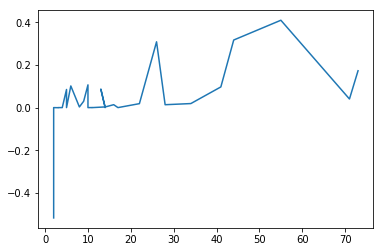

In [19]:
tree = build_sample_tree('BALBc-3')
tree_compactness(tree)

In [41]:
import numpy as np

def get_intracluster_dist(coords, limit=20000):
    if len(coords) > limit:
        ind = np.random.choice(len(coords), size=limit, replace=False)
        coords = coords[ind]
    intracluster_dist = np.mean(distance.cdist(coords, coords))
    return intracluster_dist

length = np.random.uniform(0, 1, size=20000)
angle = np.pi * np.random.uniform(0, 2, size=20000)
x = length * np.cos(angle)
y = length * np.sin(angle)

circle = np.array([x, y]).T
right_semicircle = np.array([x[x > 0], y[x > 0]]).T
left_semicircle = np.array([x[x < 0], y[x < 0]]).T

print(get_intracluster_dist(circle))
print(get_intracluster_dist(right_semicircle))
print(get_intracluster_dist(left_semicircle))

0.7251572217814769
0.6032862990604428
0.5956399608276771


## Entropy Based Metric 

In [3]:
import matplotlib.pyplot as plt 
from scipy.stats import entropy
from sklearn.neighbors import NearestNeighbors

def plot_clusters(df):
    '''
    Plot clusters.
    '''
    x, y = df['X'].values, df['Y'].values
    plt.scatter(x, y, c=df['cluster_id'].values, s=1)
    plt.show()

def calculate_cluster_entropy(df, beta=10):
    '''
    Variant of spatial entropy metric that uses nearest neighbors and conditional random fields. 
    '''
    if df.shape[0] < 4:
        return 0
    coords = df[['X', 'Y']].values
    clusters = df['cluster_id'].values
    distinct_clusters = list(set(df['cluster_id']))
    neigh = NearestNeighbors(n_neighbors=3)
    neigh.fit(coords)
    
    # calculate local conditional probability of each point 
    neighborhood_entropies = [] # store the probability of each point conditioned on its neighbors 
    U = lambda x, y: -beta*(x == y).sum()
    neighborhoods = Counter()
    nearest_neighbors = neigh.kneighbors(return_distance=False)
    for ind, nn in enumerate(nearest_neighbors):
        point_neighbors = clusters[nn]
        neigh_tuple = tuple(sorted(point_neighbors))
        neighborhoods[neigh_tuple] += 1
        probs = np.exp([-U(cluster_id, point_neighbors) for cluster_id in distinct_clusters])
        probs /= sum(probs)
        neighborhood_entropies.append([neigh_tuple, entropy(probs)])
    
    neighborhoods = {key: val/df.shape[0] for key, val in neighborhoods.items()}
    spatial_entropy = sum([local_entropy*neighborhoods[neigh_tuple] 
                           for neigh_tuple, local_entropy in neighborhood_entropies])
    return spatial_entropy

def calculate_sample_entropies(fcs_paths):
    '''
    Calculate the entropy of the data in each FCS file. 
    '''
    entropies = []
    for fcs_path in fcs_paths:
        _, cluster_data = fcsparser.parse(fcs_path)
        cluster_data = process_fcs(cluster_data)
        cluster_entropy = calculate_cluster_entropy(cluster_data)
        entropies.append(cluster_entropy)
        
    return entropies 
        
def calculate_layer_entropy(sample_name, fcs_paths, output=True, plot=True):
    '''
    Calculate the entropy of each clustering (corresponding to each layer of the tree).
    '''
    if output:
        print('Calculating layer entropies for sample', sample_name)
    neighbors = []
    entropies = []
    for ind, nn in enumerate(num_neighbors):
        _, cluster_data = fcsparser.parse(fcs_paths[ind])
        cluster_data = process_fcs(cluster_data)
        if output:
            print('Nearest neighbors', nn, 'number of clusters', 
                        len(np.unique(cluster_data['cluster_id'])))
        cluster_entropy = calculate_cluster_entropy(cluster_data)
        neighbors.append(nn)
        entropies.append(cluster_entropy)
    if plot:
        plt.figure(figsize=(10, 10))
        plt.title(sample_name)
        plt.plot(np.arange(len(entropies)), entropies)
        plt.xticks(np.arange(len(entropies)), neighbors)
        plt.xlabel('Neighbors')
        plt.ylabel('Entropy')
        plt.savefig(sample_name + '.png')
        plt.show()
    
    return neighbors, entropies

Calculating layer entropies for sample BALBc-3


/n/home05/aewhatley/anaconda3/lib/python3.6/site-packages/fcsparser/api.py:332: UserWarning: The default channel names (defined by the $PnS parameter in the FCS file) were not unique. To avoid problems in downstream analysis, the channel names have been switched to the alternate channel names defined in the FCS file. To avoid seeing this warning message, explicitly instruct the FCS parser to use the alternate channel names by specifying the channel_naming parameter.
  warnings.warn(msg)


Nearest neighbors 140 number of clusters 12


/n/home05/aewhatley/anaconda3/lib/python3.6/site-packages/fcsparser/api.py:332: UserWarning: The default channel names (defined by the $PnS parameter in the FCS file) were not unique. To avoid problems in downstream analysis, the channel names have been switched to the alternate channel names defined in the FCS file. To avoid seeing this warning message, explicitly instruct the FCS parser to use the alternate channel names by specifying the channel_naming parameter.
  warnings.warn(msg)


Nearest neighbors 135 number of clusters 12
Nearest neighbors 130 number of clusters 13
Nearest neighbors 125 number of clusters 14
Nearest neighbors 120 number of clusters 14
Nearest neighbors 115 number of clusters 15
Nearest neighbors 110 number of clusters 15
Nearest neighbors 105 number of clusters 16
Nearest neighbors 100 number of clusters 18
Nearest neighbors 95 number of clusters 18
Nearest neighbors 90 number of clusters 19
Nearest neighbors 85 number of clusters 19
Nearest neighbors 80 number of clusters 20
Nearest neighbors 75 number of clusters 21
Nearest neighbors 70 number of clusters 22
Nearest neighbors 65 number of clusters 21
Nearest neighbors 60 number of clusters 21
Nearest neighbors 55 number of clusters 22
Nearest neighbors 50 number of clusters 24
Nearest neighbors 45 number of clusters 24
Nearest neighbors 40 number of clusters 28
Nearest neighbors 35 number of clusters 31
Nearest neighbors 30 number of clusters 35
Nearest neighbors 25 number of clusters 43
Nea

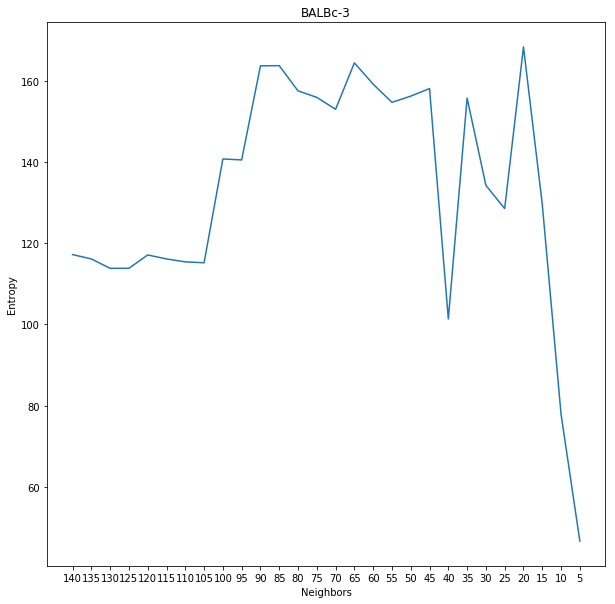

Calculating layer entropies for sample MRL-4
Nearest neighbors 140 number of clusters 21
Nearest neighbors 135 number of clusters 21
Nearest neighbors 130 number of clusters 21
Nearest neighbors 125 number of clusters 21
Nearest neighbors 120 number of clusters 20
Nearest neighbors 115 number of clusters 20
Nearest neighbors 110 number of clusters 20
Nearest neighbors 105 number of clusters 22
Nearest neighbors 100 number of clusters 23
Nearest neighbors 95 number of clusters 23
Nearest neighbors 90 number of clusters 23
Nearest neighbors 85 number of clusters 23
Nearest neighbors 80 number of clusters 25
Nearest neighbors 75 number of clusters 24
Nearest neighbors 70 number of clusters 27
Nearest neighbors 65 number of clusters 27
Nearest neighbors 60 number of clusters 28
Nearest neighbors 55 number of clusters 30
Nearest neighbors 50 number of clusters 30
Nearest neighbors 45 number of clusters 29
Nearest neighbors 40 number of clusters 31
Nearest neighbors 35 number of clusters 32


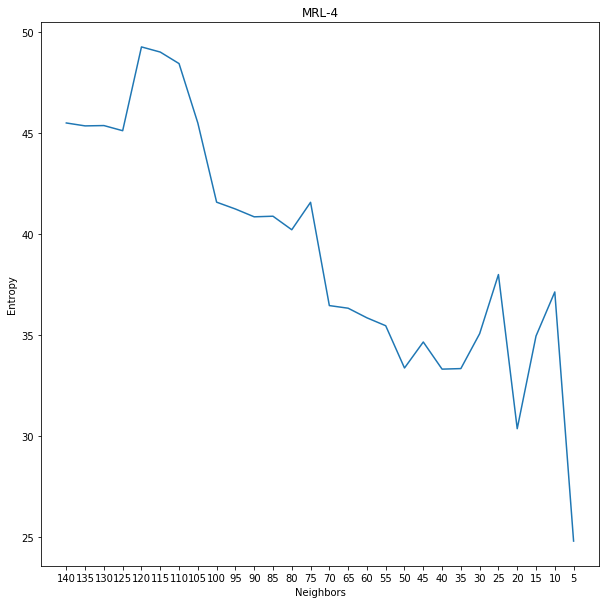

Calculating layer entropies for sample MRL-5
Nearest neighbors 140 number of clusters 17
Nearest neighbors 135 number of clusters 17
Nearest neighbors 130 number of clusters 17
Nearest neighbors 125 number of clusters 18
Nearest neighbors 120 number of clusters 18
Nearest neighbors 115 number of clusters 18
Nearest neighbors 110 number of clusters 19
Nearest neighbors 105 number of clusters 19
Nearest neighbors 100 number of clusters 19
Nearest neighbors 95 number of clusters 18
Nearest neighbors 90 number of clusters 19
Nearest neighbors 85 number of clusters 19
Nearest neighbors 80 number of clusters 19
Nearest neighbors 75 number of clusters 20
Nearest neighbors 70 number of clusters 20
Nearest neighbors 65 number of clusters 21
Nearest neighbors 60 number of clusters 23
Nearest neighbors 55 number of clusters 24
Nearest neighbors 50 number of clusters 24
Nearest neighbors 45 number of clusters 27
Nearest neighbors 40 number of clusters 30
Nearest neighbors 35 number of clusters 35


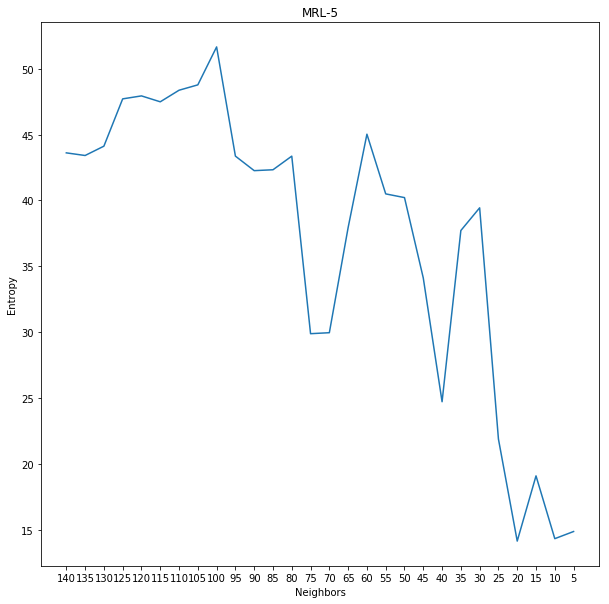

Calculating layer entropies for sample MRL-6
Nearest neighbors 140 number of clusters 16
Nearest neighbors 135 number of clusters 16
Nearest neighbors 130 number of clusters 16
Nearest neighbors 125 number of clusters 16
Nearest neighbors 120 number of clusters 17
Nearest neighbors 115 number of clusters 18
Nearest neighbors 110 number of clusters 19
Nearest neighbors 105 number of clusters 19
Nearest neighbors 100 number of clusters 19
Nearest neighbors 95 number of clusters 19
Nearest neighbors 90 number of clusters 19
Nearest neighbors 85 number of clusters 19
Nearest neighbors 80 number of clusters 19
Nearest neighbors 75 number of clusters 19
Nearest neighbors 70 number of clusters 20
Nearest neighbors 65 number of clusters 20
Nearest neighbors 60 number of clusters 22
Nearest neighbors 55 number of clusters 22
Nearest neighbors 50 number of clusters 22
Nearest neighbors 45 number of clusters 25
Nearest neighbors 40 number of clusters 24
Nearest neighbors 35 number of clusters 27


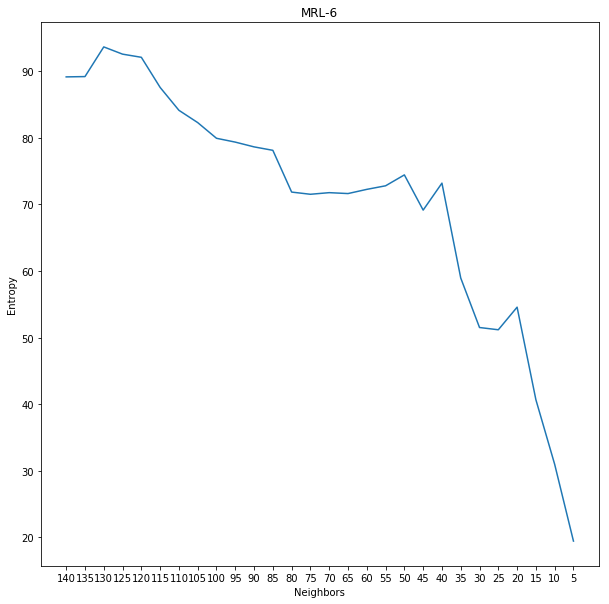

Calculating layer entropies for sample MRL-7
Nearest neighbors 140 number of clusters 17
Nearest neighbors 135 number of clusters 17
Nearest neighbors 130 number of clusters 18
Nearest neighbors 125 number of clusters 18
Nearest neighbors 120 number of clusters 18
Nearest neighbors 115 number of clusters 18
Nearest neighbors 110 number of clusters 18
Nearest neighbors 105 number of clusters 18
Nearest neighbors 100 number of clusters 19
Nearest neighbors 95 number of clusters 20
Nearest neighbors 90 number of clusters 20
Nearest neighbors 85 number of clusters 21
Nearest neighbors 80 number of clusters 21
Nearest neighbors 75 number of clusters 21
Nearest neighbors 70 number of clusters 24
Nearest neighbors 65 number of clusters 24
Nearest neighbors 60 number of clusters 26
Nearest neighbors 55 number of clusters 26
Nearest neighbors 50 number of clusters 27
Nearest neighbors 45 number of clusters 29
Nearest neighbors 40 number of clusters 32
Nearest neighbors 35 number of clusters 31


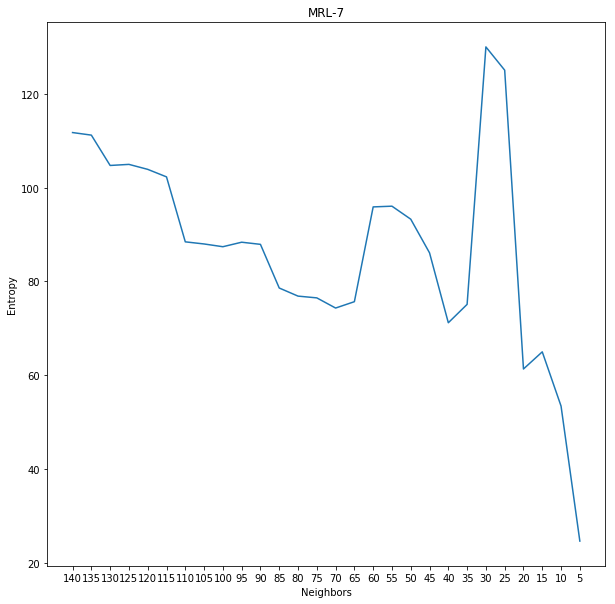

Calculating layer entropies for sample MRL-8
Nearest neighbors 140 number of clusters 21
Nearest neighbors 135 number of clusters 21
Nearest neighbors 130 number of clusters 21
Nearest neighbors 125 number of clusters 21
Nearest neighbors 120 number of clusters 22
Nearest neighbors 115 number of clusters 22
Nearest neighbors 110 number of clusters 23
Nearest neighbors 105 number of clusters 23
Nearest neighbors 100 number of clusters 24
Nearest neighbors 95 number of clusters 24
Nearest neighbors 90 number of clusters 25
Nearest neighbors 85 number of clusters 25
Nearest neighbors 80 number of clusters 25
Nearest neighbors 75 number of clusters 26
Nearest neighbors 70 number of clusters 26
Nearest neighbors 65 number of clusters 26
Nearest neighbors 60 number of clusters 26
Nearest neighbors 55 number of clusters 26
Nearest neighbors 50 number of clusters 27
Nearest neighbors 45 number of clusters 27
Nearest neighbors 40 number of clusters 30
Nearest neighbors 35 number of clusters 32


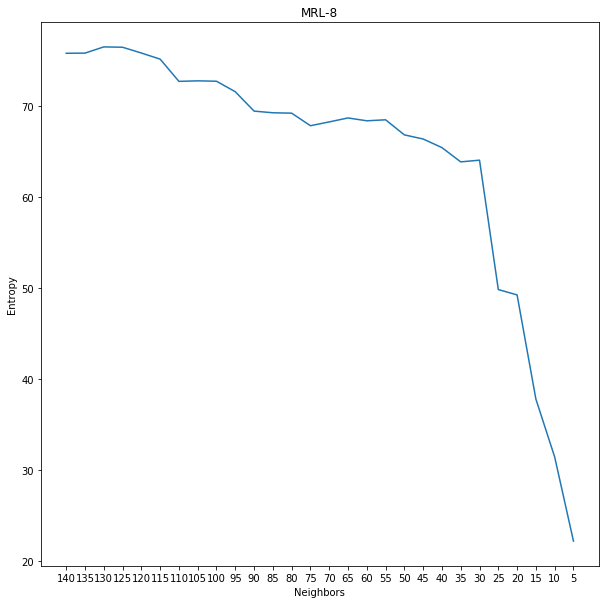

Calculating layer entropies for sample MRL-9
Nearest neighbors 140 number of clusters 14
Nearest neighbors 135 number of clusters 15
Nearest neighbors 130 number of clusters 15
Nearest neighbors 125 number of clusters 15
Nearest neighbors 120 number of clusters 15
Nearest neighbors 115 number of clusters 15
Nearest neighbors 110 number of clusters 15
Nearest neighbors 105 number of clusters 16
Nearest neighbors 100 number of clusters 16
Nearest neighbors 95 number of clusters 17
Nearest neighbors 90 number of clusters 17
Nearest neighbors 85 number of clusters 17
Nearest neighbors 80 number of clusters 16
Nearest neighbors 75 number of clusters 17
Nearest neighbors 70 number of clusters 17
Nearest neighbors 65 number of clusters 17
Nearest neighbors 60 number of clusters 19
Nearest neighbors 55 number of clusters 21
Nearest neighbors 50 number of clusters 21
Nearest neighbors 45 number of clusters 26
Nearest neighbors 40 number of clusters 27
Nearest neighbors 35 number of clusters 28


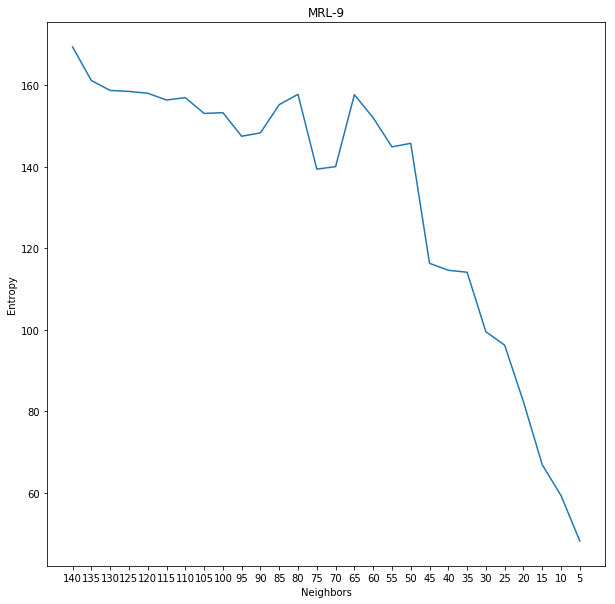

In [4]:
# create individual graphs for entropies for each sample
samples = ['BALBc-1', 'BALBc-2', 'BALBc-3', 'MRL-4', 'MRL-5', 'MRL-6', 'MRL-7', 'MRL-8', 'MRL-9']
num_neighbors = list(reversed(range(5, 140+1, 5)))
for sample in samples:
    fcs_paths = ['/n/regal/nowak_lab/aewhatley/X-Shift_Analysis/' + sample + '/' + 
                 str(nn) + '/out/' + sample + '.fcs' for nn in num_neighbors]   
    neighbors, entropies = calculate_layer_entropy(sample, fcs_paths)

Nearest neighbors 40


/n/home05/aewhatley/anaconda3/lib/python3.6/site-packages/fcsparser/api.py:332: UserWarning: The default channel names (defined by the $PnS parameter in the FCS file) were not unique. To avoid problems in downstream analysis, the channel names have been switched to the alternate channel names defined in the FCS file. To avoid seeing this warning message, explicitly instruct the FCS parser to use the alternate channel names by specifying the channel_naming parameter.
  warnings.warn(msg)


Nearest neighbors 60
Nearest neighbors 80


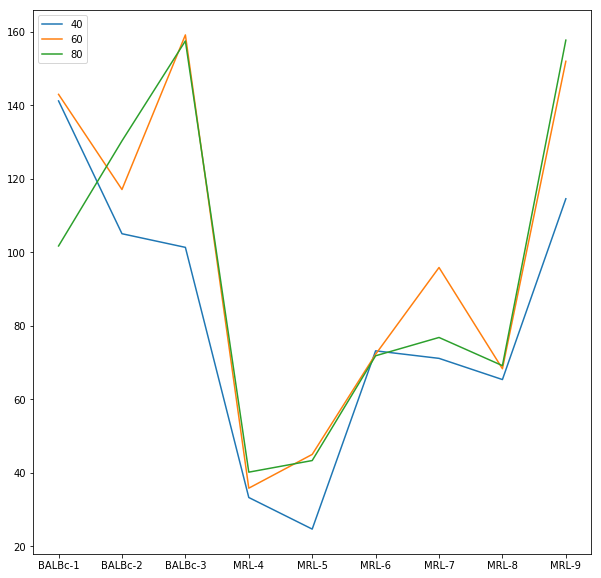

In [13]:
progression = ['BALBc-1', 'BALBc-2', 'BALBc-3', 'MRL-4', 'MRL-5', 'MRL-6', 'MRL-7', 'MRL-8', 'MRL-9']
plt.figure(figsize=(10, 10))
for nn in [40, 60, 80]:
    print('Nearest neighbors', nn)
    fcs_paths = ['/n/regal/nowak_lab/aewhatley/X-Shift_Analysis/' + sample + '/' + 
             str(nn) + '/out/' + sample + '.fcs' for sample in progression]  
    plt.plot(np.arange(len(progression)), calculate_sample_entropies(fcs_paths), label=nn)
    plt.xticks(np.arange(len(progression)), progression)
plt.legend()
plt.show()

Plot for graph created with 140 nearest neighbors X-shift.


/n/home05/aewhatley/anaconda3/lib/python3.6/site-packages/fcsparser/api.py:332: UserWarning: The default channel names (defined by the $PnS parameter in the FCS file) were not unique. To avoid problems in downstream analysis, the channel names have been switched to the alternate channel names defined in the FCS file. To avoid seeing this warning message, explicitly instruct the FCS parser to use the alternate channel names by specifying the channel_naming parameter.
  warnings.warn(msg)


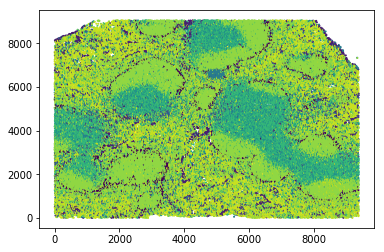

Plot for graph created with 135 nearest neighbors X-shift.


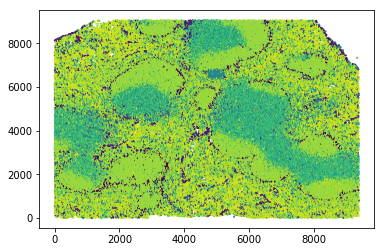

Plot for graph created with 130 nearest neighbors X-shift.


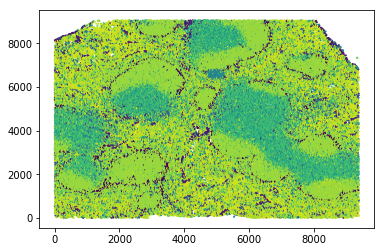

Plot for graph created with 125 nearest neighbors X-shift.


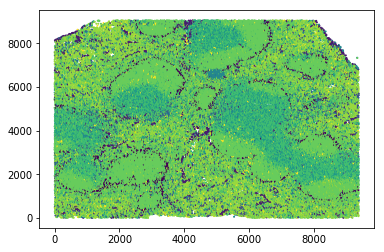

Plot for graph created with 120 nearest neighbors X-shift.


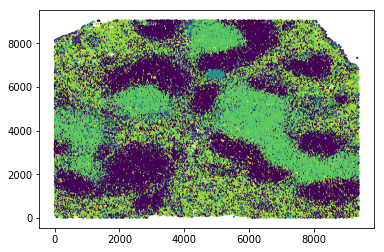

Plot for graph created with 115 nearest neighbors X-shift.


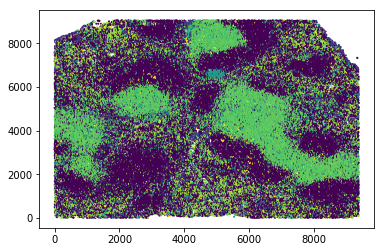

Plot for graph created with 110 nearest neighbors X-shift.


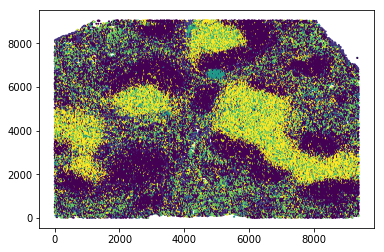

Plot for graph created with 105 nearest neighbors X-shift.


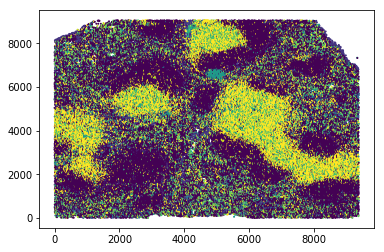

Plot for graph created with 100 nearest neighbors X-shift.


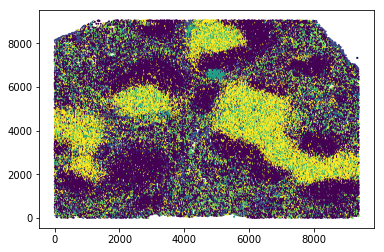

Plot for graph created with 95 nearest neighbors X-shift.


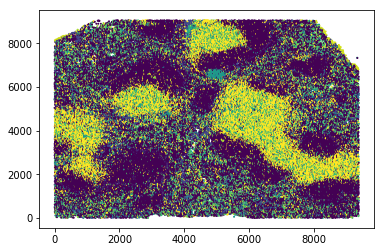

Plot for graph created with 90 nearest neighbors X-shift.


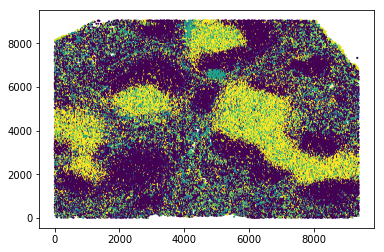

Plot for graph created with 85 nearest neighbors X-shift.


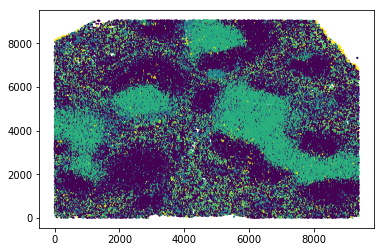

Plot for graph created with 80 nearest neighbors X-shift.


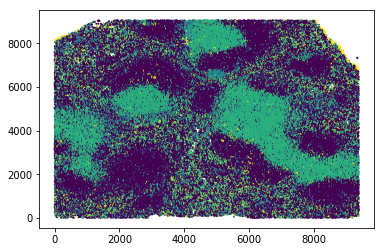

Plot for graph created with 75 nearest neighbors X-shift.


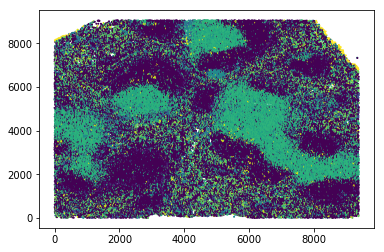

Plot for graph created with 70 nearest neighbors X-shift.


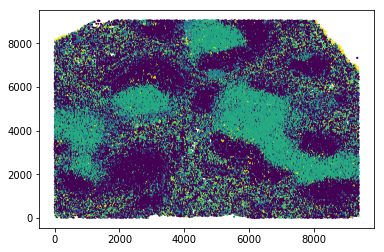

Plot for graph created with 65 nearest neighbors X-shift.


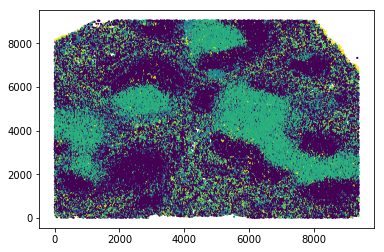

Plot for graph created with 60 nearest neighbors X-shift.


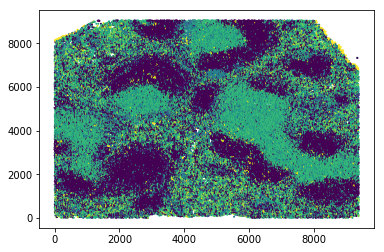

Plot for graph created with 55 nearest neighbors X-shift.


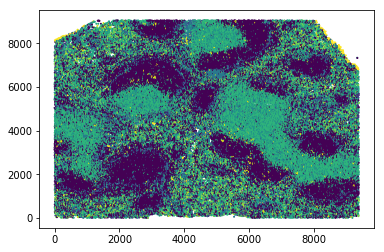

Plot for graph created with 50 nearest neighbors X-shift.


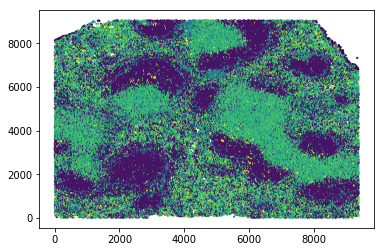

Plot for graph created with 45 nearest neighbors X-shift.


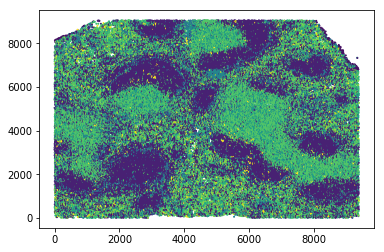

Plot for graph created with 40 nearest neighbors X-shift.


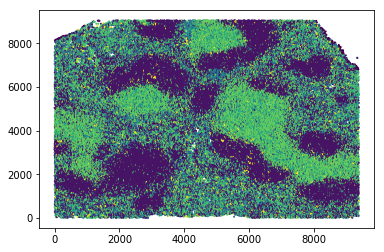

Plot for graph created with 35 nearest neighbors X-shift.


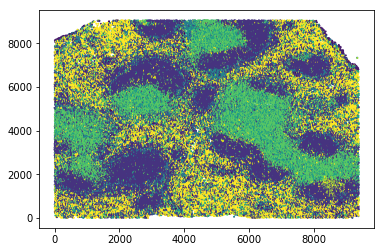

Plot for graph created with 30 nearest neighbors X-shift.


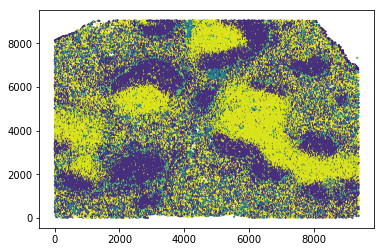

Plot for graph created with 25 nearest neighbors X-shift.


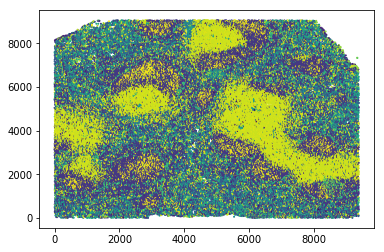

Plot for graph created with 20 nearest neighbors X-shift.


FileNotFoundError: [Errno 2] No such file or directory: '/n/regal/nowak_lab/aewhatley/X-Shift_Analysis/Clusters/20/out/BALBc-1.fcs'

In [7]:
for ind, nn in enumerate(num_neighbors):
    print('Plot for graph created with {} nearest neighbors X-shift.'.format(nn))
    _, cluster_data = fcsparser.parse(fcs_paths[ind])
    cluster_data = process_fcs(cluster_data)
    plot_clusters(cluster_data)

/n/home05/aewhatley/anaconda3/lib/python3.6/site-packages/fcsparser/api.py:332: UserWarning: The default channel names (defined by the $PnS parameter in the FCS file) were not unique. To avoid problems in downstream analysis, the channel names have been switched to the alternate channel names defined in the FCS file. To avoid seeing this warning message, explicitly instruct the FCS parser to use the alternate channel names by specifying the channel_naming parameter.
  warnings.warn(msg)


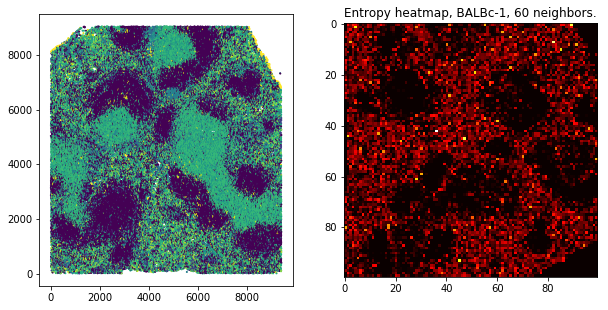

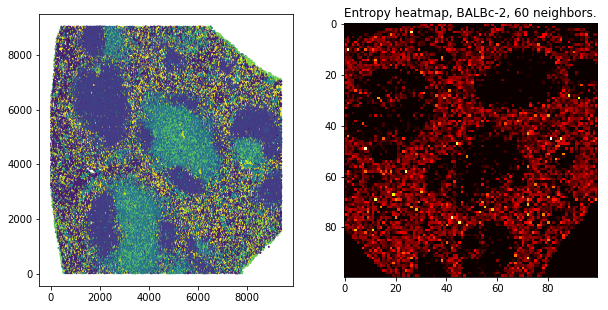

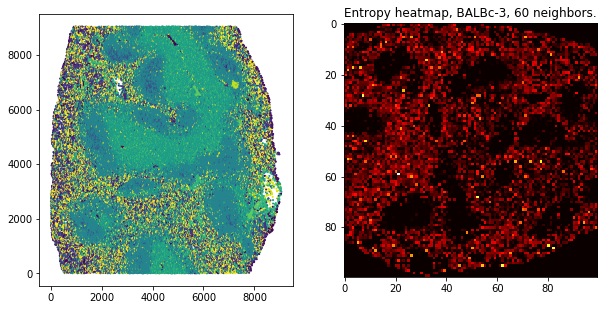

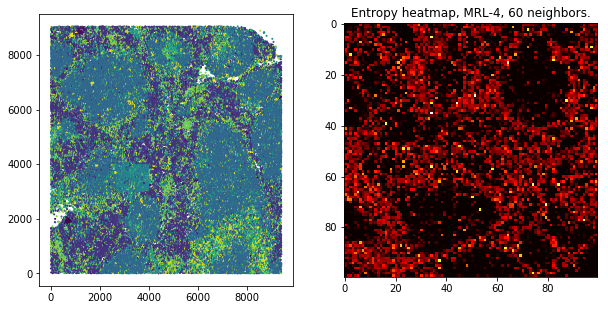

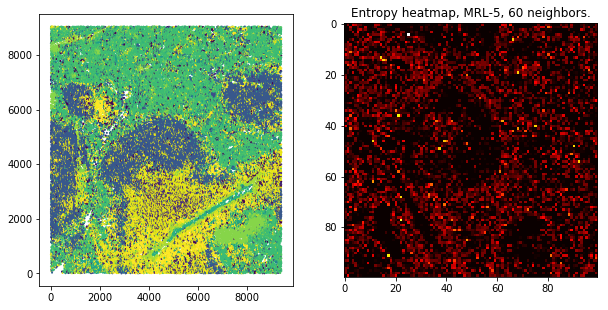

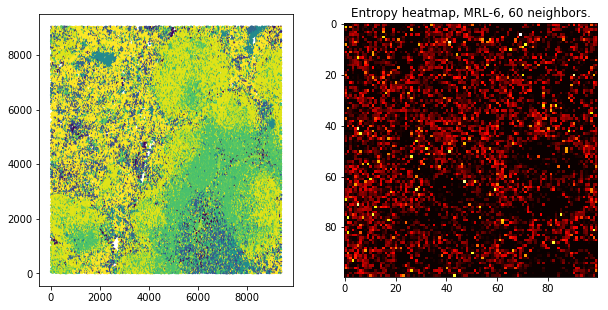

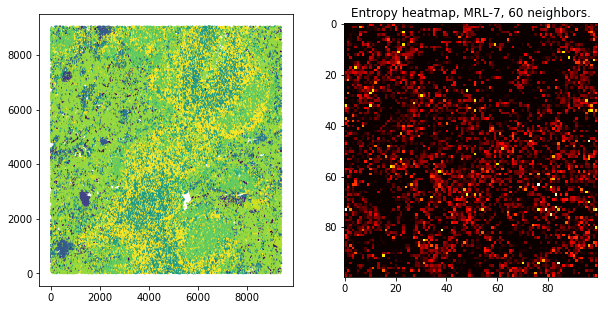

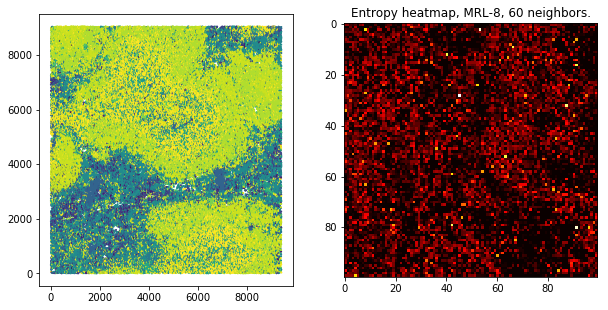

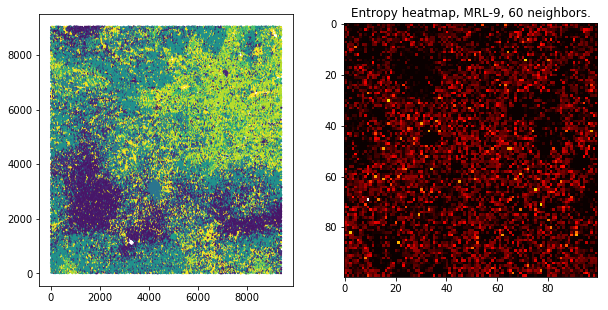

In [5]:
# calculate entropy for each region of cell plate 
samples = ['BALBc-1', 'BALBc-2', 'BALBc-3', 'MRL-4', 'MRL-5',
           'MRL-6', 'MRL-7', 'MRL-8', 'MRL-9']
nn = 60
grid_size = 100
for sample in samples:
    fig, ax = plt.subplots(1, 2, figsize=(10, 5))
    _, cluster_data = fcsparser.parse('/n/regal/nowak_lab/aewhatley/X-Shift_Analysis/' + \
                                      sample + '/' + str(nn) + '/out/' + sample + '.fcs')
    cluster_data = process_fcs(cluster_data)
    cluster_data['cluster_id'] = cluster_data['cluster_id'].astype(int)
    cluster_data = convert_coordinates(cluster_data)
    x, y = cluster_data['X'].values, cluster_data['Y'].values
    ax[0].scatter(x, y, c=cluster_data['cluster_id'].values, s=1)
    max_x, max_y = max(cluster_data['X.X']), max(cluster_data['Y.Y'])
    grid_x, grid_y = max_x / grid_size, max_y / grid_size
    entropies = np.zeros((grid_size, grid_size))
    for i in range(grid_size):
        for j in range(grid_size):
            subgrid = cluster_data[(grid_x*i<cluster_data['X.X']) & \
                                   (grid_y*j<cluster_data['Y.Y']) & \
                                   (cluster_data['X.X']<grid_x*(i+1)) & \
                                   (cluster_data['Y.Y']<grid_y*(j+1))]
            entropies[i, j] = calculate_cluster_entropy(subgrid)
    ax[1].set_title('Entropy heatmap, ' + sample + ', ' + str(nn) + ' neighbors.')
    ax[1].imshow(entropies, cmap='hot', interpolation='nearest')
    plt.show()

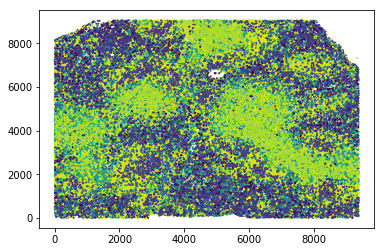

In [15]:
import pandas as pd
import matplotlib.pyplot as plt
df = pd.read_csv('../Suppl.Table2.CODEX_paper_MRLdatasetexpression.csv')
df = df[df['sample_Xtile_Ytile'].str.contains('BALBc-1')]
df = convert_coordinates(df)
df.dropna(inplace=True)
df['Imaging phenotype cluster ID'] = df['Imaging phenotype cluster ID'].astype(int)
df = df[['X.X', 'Y.Y', 'Z.Z', 'Imaging phenotype cluster ID']]
plt.scatter(df['X.X'], df['Y.Y'], c=df['Imaging phenotype cluster ID'], s=1)
plt.show()